Генерация слоя городских кварталов с помощью blocksnet

In [470]:
!pip install blocksnet  -q
!pip install blocksnet ipykernel mapclassify -qq


In [471]:
import geopandas as gpd
import osmnx as ox
import pandas as pd
import os


In [ ]:
data_path = "../data/scenario 0 - data"
results_path = "../results/scenario 0 - results"

<h3>Загрузка границ, дорог, построение полигонов</h3>

<Axes: >

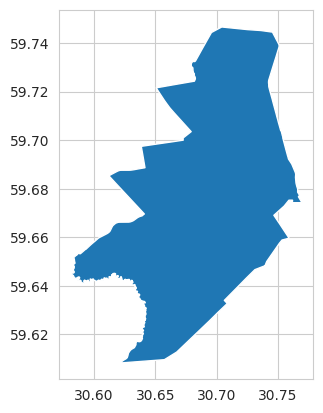

In [473]:
boundary = gpd.read_file(os.path.join(data_path,'boundary.geojson'))
boundary.plot()

<Axes: >

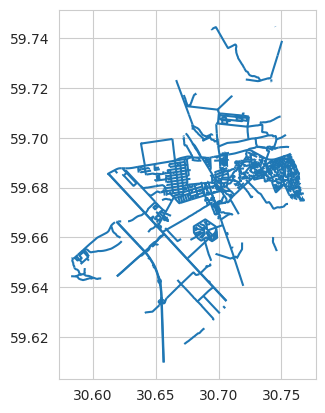

In [474]:
roads = gpd.read_file(os.path.join(data_path,'roads.geojson'))
roads.plot()

In [475]:
local_crs = boundary.estimate_utm_crs()
local_crs

<Projected CRS: EPSG:32636>
Name: WGS 84 / UTM zone 36N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 30°E and 36°E, northern hemisphere between equator and 84°N, onshore and offshore. Belarus. Cyprus. Egypt. Ethiopia. Finland. Israel. Jordan. Kenya. Lebanon. Moldova. Norway. Russian Federation. Saudi Arabia. Sudan. Syria. Türkiye (Turkey). Uganda. Ukraine.
- bounds: (30.0, 0.0, 36.0, 84.0)
Coordinate Operation:
- name: UTM zone 36N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [476]:
boundary = boundary.reset_index()[['geometry']].to_crs(local_crs)
roads = roads.reset_index()[['geometry']].to_crs(local_crs)

In [477]:
import momepy

roads = roads[roads.geom_type.isin(['LineString', 'MultiLineString'])]
GAP_TOLERANCE = 1
def _get_roads(roads):
    merged = roads.unary_union
    if merged.geom_type == 'MultiLineString':
        roads = gpd.GeoDataFrame(geometry=list(merged.geoms), crs=roads.crs)
    else:
        roads = gpd.GeoDataFrame(geometry=[merged], crs=roads.crs)
    roads = roads.explode(index_parts=False).reset_index(drop=True)
    roads.geometry = momepy.close_gaps(roads, GAP_TOLERANCE)
    roads = roads[roads.geom_type.isin(['LineString'])]
    return roads

roads = _get_roads(roads)
roads

,geometry
0,"LINESTRING (365578.066 6618818.811, 365585.179..."
1,"LINESTRING (367700.433 6616376.542, 367698.837..."
2,"LINESTRING (368477.180 6617657.195, 368413.340..."
3,"LINESTRING (368413.340 6617725.792, 368382.078..."
4,"LINESTRING (372228.902 6619496.063, 372224.703..."
...,...
1786,"LINESTRING (368975.091 6614891.328, 368975.090..."
1787,"LINESTRING (368846.474 6616614.665, 368105.752..."
1788,"LINESTRING (368105.752 6616224.754, 367914.444..."
1789,"LINESTRING (367914.444 6616124.050, 367914.444..."


In [478]:
from blocksnet import BlocksGenerator

bg = BlocksGenerator(boundary, roads, None, None)

2024-12-24 19:06:23.710 | INFO     | blocksnet.preprocessing.blocks_generator:__init__:99 - Check boundaries schema
2024-12-24 19:06:23.740 | INFO     | blocksnet.preprocessing.blocks_generator:__init__:103 - Check roads schema
2024-12-24 19:06:23.761 | INFO     | blocksnet.preprocessing.blocks_generator:__init__:109 - Check railways schema
2024-12-24 19:06:23.771 | INFO     | blocksnet.preprocessing.blocks_generator:__init__:115 - Check water schema
2024-12-24 19:06:23.800 | INFO     | blocksnet.preprocessing.blocks_generator:__init__:124 - Exclude water objects


In [479]:
blocks = bg.run()
blocks

2024-12-24 19:06:23.840 | INFO     | blocksnet.preprocessing.blocks_generator:run:161 - Generating blocks
2024-12-24 19:06:23.879 | INFO     | blocksnet.preprocessing.blocks_generator:run:170 - Setting up enclosures
2024-12-24 19:06:24.061 | INFO     | blocksnet.preprocessing.blocks_generator:run:174 - Filling holes
2024-12-24 19:06:24.168 | INFO     | blocksnet.preprocessing.blocks_generator:run:178 - Dropping overlapping blocks
2024-12-24 19:06:24.320 | INFO     | blocksnet.preprocessing.blocks_generator:run:192 - Calculating blocks area
2024-12-24 19:06:24.335 | INFO     | blocksnet.preprocessing.blocks_generator:run:199 - Blocks generated


,geometry
0,"POLYGON ((365578.066 6618818.811, 365585.179 6..."
1,"POLYGON ((365585.179 6618823.682, 365578.066 6..."
2,"POLYGON ((367700.433 6616376.542, 367698.837 6..."
3,"POLYGON ((367699.528 6616357.359, 367698.808 6..."
4,"POLYGON ((368477.180 6617657.195, 368413.340 6..."
...,...
327,"POLYGON ((370449.324 6618051.325, 370432.307 6..."
328,"POLYGON ((370460.756 6618032.684, 370449.324 6..."
329,"POLYGON ((370467.724 6618030.470, 370467.981 6..."
330,"POLYGON ((370455.659 6618057.013, 370439.946 6..."


<Axes: >

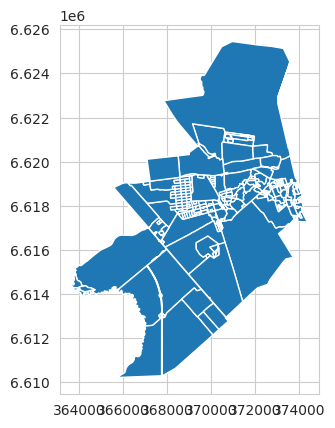

In [480]:
blocks.plot()

In [481]:
blocks.to_file(os.path.join(results_path,'blocks_blocksnet_1.geojson'))

### Свои дороги

In [482]:
CRS = 32636
SPEED_M_MIN = 1000

import networkx as nx

def _roads_to_graph(roads):
    graph = momepy.gdf_to_nx(roads)
    graph.graph['crs'] = roads.crs.to_epsg()
    graph = nx.DiGraph(graph)
    for _, _, data in graph.edges(data=True):
        geometry = data['geometry']
        data['time_min'] = geometry.length / SPEED_M_MIN
        # data['weight'] = data['mm_len'] / 1000 / 1000
        # data['length_meter'] = data['mm_len'] / 1000
    for n, data in graph.nodes(data=True):
        graph.nodes[n]['x'] = n[0]  # Assign X coordinate to node
        graph.nodes[n]['y'] = n[1]

    return graph

roads_G = _roads_to_graph(roads)
roads_G

In [483]:
from blocksnet import AccessibilityProcessor
AccessibilityProcessor._fix_graph(roads_G)

In [484]:
from blocksnet import AccessibilityProcessor

ap = AccessibilityProcessor(blocks)
acc_mx = ap.get_accessibility_matrix(roads_G)
acc_mx.head() # вывод первых 5 строк полученной матрицы

,0,1,2,3,4,5,6,7,8,9,...,322,323,324,325,326,327,328,329,330,331
0,0.000000,1.937500,2.962891,5.796875,4.253906,4.492188,7.527344,7.738281,7.386719,7.691406,...,5.992188,5.968750,6.031250,5.980469,6.015625,6.023438,6.054688,6.082031,6.031250,6.019531
1,1.937500,0.000000,4.308594,7.132812,2.791016,3.458984,5.609375,5.820312,5.468750,5.773438,...,4.316406,4.292969,4.355469,4.308594,4.339844,4.347656,4.378906,4.375000,4.359375,4.343750
2,2.962891,4.308594,0.000000,2.835938,1.666992,1.792969,6.339844,6.269531,6.011719,5.683594,...,3.558594,3.537109,3.597656,3.548828,3.582031,3.589844,3.621094,3.650391,3.599609,3.587891
3,5.796875,7.132812,2.835938,0.000000,4.492188,4.617188,7.914062,7.714844,7.667969,7.339844,...,5.449219,5.468750,5.410156,5.484375,5.472656,5.472656,5.437500,5.417969,5.488281,5.472656
4,4.253906,2.791016,1.666992,4.492188,0.000000,0.819336,5.011719,4.941406,4.683594,4.355469,...,2.228516,2.207031,2.267578,2.218750,2.251953,2.259766,2.292969,2.320312,2.269531,2.257812


In [485]:
from blocksnet.models import City
from blocksnet import Accessibility, Connectivity

blocks['land_use'] = None

city = City(
    blocks=blocks,
    acc_mx=acc_mx
)

connectivity = Connectivity(city_model=city)
connectivity_result = connectivity.calculate()
connectivity_result

,geometry,connectivity
id,,
0,"POLYGON ((365578.066 6618818.811, 365585.179 6...",6.222656
1,"POLYGON ((365585.179 6618823.682, 365578.066 6...",4.917969
2,"POLYGON ((367700.433 6616376.542, 367698.837 6...",3.593750
3,"POLYGON ((367699.528 6616357.359, 367698.808 6...",5.835938
4,"POLYGON ((368477.180 6617657.195, 368413.340 6...",2.785156
...,...,...
327,"POLYGON ((370449.324 6618051.325, 370432.307 6...",2.667969
328,"POLYGON ((370460.756 6618032.684, 370449.324 6...",2.660156
329,"POLYGON ((370467.724 6618030.470, 370467.981 6...",2.667969


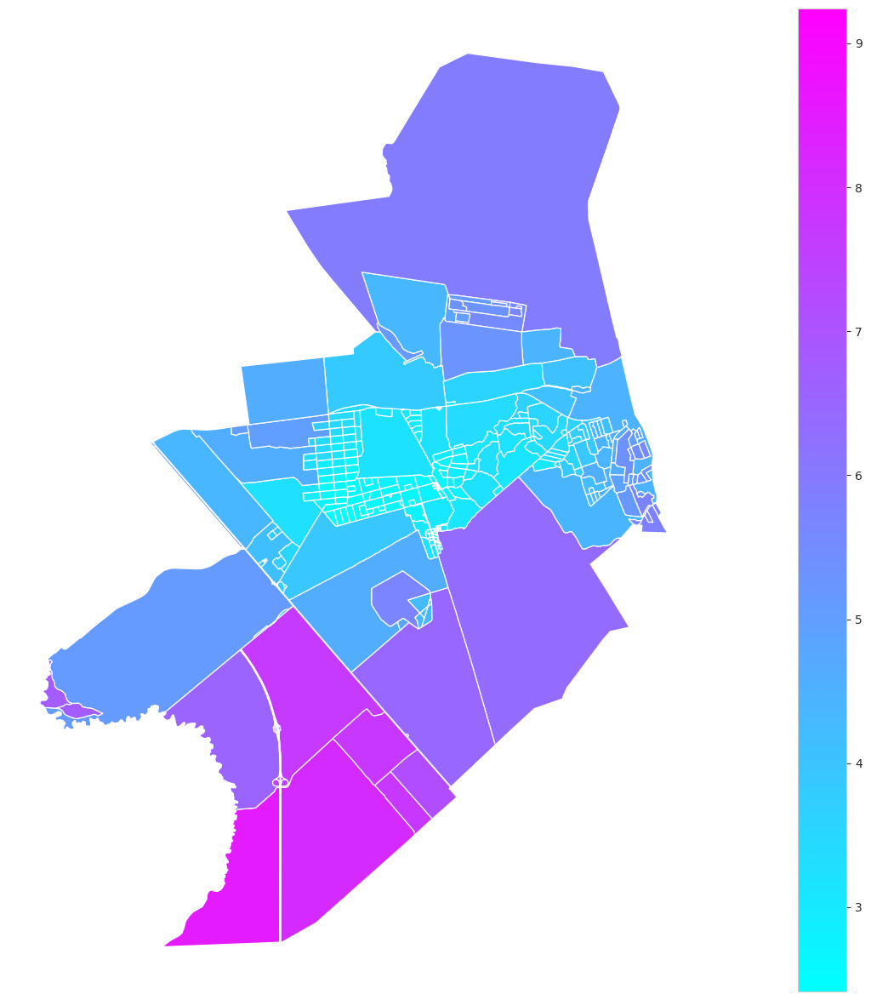

In [486]:
Connectivity.plot(connectivity_result, linewidth=0.9, figsize=(30,15))

In [487]:
import os
acc_mx.to_pickle(os.path.join(results_path,'acc_mx_1.pickle'))
city.to_pickle(os.path.join(results_path,'city_model_scenario 1.pickle'))

----

###Загрузка зданий

In [488]:
buildings = gpd.read_file(os.path.join(data_path,'buildings.geojson'))
buildings.explore()

In [489]:
buildings = buildings.to_crs(local_crs) # переводим здания в локальную систему координат
buildings.crs

<Projected CRS: EPSG:32636>
Name: WGS 84 / UTM zone 36N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 30°E and 36°E, northern hemisphere between equator and 84°N, onshore and offshore. Belarus. Cyprus. Egypt. Ethiopia. Finland. Israel. Jordan. Kenya. Lebanon. Moldova. Norway. Russian Federation. Saudi Arabia. Sudan. Syria. Türkiye (Turkey). Uganda. Ukraine.
- bounds: (30.0, 0.0, 36.0, 84.0)
Coordinate Operation:
- name: UTM zone 36N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [490]:
buildings

,building:levels,addr:street,addr:region,addr:housenumber,addr:city,is_living,type,id,living_area,population,building,geometry
0,3,Комсомольская,Ленинградская область,21А,Красный Бор,1,building,NaN,2329.637639,90,residential,"MULTIPOLYGON (((370329.134 6617244.346, 370315..."
1,2,Комсомольская,Ленинградская область,1,Красный Бор,1,building,8750859.0,545.200000,14,residential,"MULTIPOLYGON (((370489.026 6616725.676, 370473..."
2,5,Комсомольская,Ленинградская область,10,Красный Бор,1,building,8751050.0,6480.900000,231,residential,"MULTIPOLYGON (((370502.693 6617067.672, 370488..."
3,2,Комсомольская,Ленинградская область,9/1,Красный Бор,1,building,8750923.0,726.736021,27,residential,"MULTIPOLYGON (((370423.032 6616944.827, 370407..."
4,2,Культуры,Ленинградская область,1/36,Красный Бор,1,building,NaN,1145.349545,46,residential,"MULTIPOLYGON (((370335.122 6618166.306, 370323..."
...,...,...,...,...,...,...,...,...,...,...,...,...
4786,1,None,None,None,None,0,building,NaN,NaN,0,None,"MULTIPOLYGON (((371083.463 6616832.478, 371105..."
4787,1,None,None,None,None,0,building,NaN,NaN,0,None,"MULTIPOLYGON (((370660.184 6617353.896, 370660..."
4788,1,None,None,None,None,0,building,NaN,NaN,0,None,"MULTIPOLYGON (((370646.427 6617582.335, 370651..."
4789,1,None,None,None,None,0,building,NaN,NaN,0,None,"MULTIPOLYGON (((370591.537 6617578.189, 370596..."


In [491]:
buildings = buildings[buildings.geometry.type.isin(['Polygon', 'MultiPolygon'])]
buildings.head()

,building:levels,addr:street,addr:region,addr:housenumber,addr:city,is_living,type,id,living_area,population,building,geometry
0,3,Комсомольская,Ленинградская область,21А,Красный Бор,1,building,NaN,2329.637639,90,residential,"MULTIPOLYGON (((370329.134 6617244.346, 370315..."
1,2,Комсомольская,Ленинградская область,1,Красный Бор,1,building,8750859.0,545.200000,14,residential,"MULTIPOLYGON (((370489.026 6616725.676, 370473..."
2,5,Комсомольская,Ленинградская область,10,Красный Бор,1,building,8751050.0,6480.900000,231,residential,"MULTIPOLYGON (((370502.693 6617067.672, 370488..."
3,2,Комсомольская,Ленинградская область,9/1,Красный Бор,1,building,8750923.0,726.736021,27,residential,"MULTIPOLYGON (((370423.032 6616944.827, 370407..."
4,2,Культуры,Ленинградская область,1/36,Красный Бор,1,building,NaN,1145.349545,46,residential,"MULTIPOLYGON (((370335.122 6618166.306, 370323..."


In [492]:
# Сброс индекса, чтобы превратить индексы в обычные столбцы
buildings = buildings.reset_index(drop=True)
# Проверяем результат
buildings.head()

,building:levels,addr:street,addr:region,addr:housenumber,addr:city,is_living,type,id,living_area,population,building,geometry
0,3,Комсомольская,Ленинградская область,21А,Красный Бор,1,building,NaN,2329.637639,90,residential,"MULTIPOLYGON (((370329.134 6617244.346, 370315..."
1,2,Комсомольская,Ленинградская область,1,Красный Бор,1,building,8750859.0,545.200000,14,residential,"MULTIPOLYGON (((370489.026 6616725.676, 370473..."
2,5,Комсомольская,Ленинградская область,10,Красный Бор,1,building,8751050.0,6480.900000,231,residential,"MULTIPOLYGON (((370502.693 6617067.672, 370488..."
3,2,Комсомольская,Ленинградская область,9/1,Красный Бор,1,building,8750923.0,726.736021,27,residential,"MULTIPOLYGON (((370423.032 6616944.827, 370407..."
4,2,Культуры,Ленинградская область,1/36,Красный Бор,1,building,NaN,1145.349545,46,residential,"MULTIPOLYGON (((370335.122 6618166.306, 370323..."


In [493]:
# Преобразуем столбец 'building:levels' в числовой тип, ошибки будут заменены на NaN
buildings['building:levels'] = pd.to_numeric(buildings['building:levels'], errors='coerce')

# Заполним пропущенные значения (NaN) нулями или другими подходящими значениями
buildings = buildings.fillna(0)

# Добавляем или преобразуем необходимые атрибуты

# 1. Количество этажей (number_of_floors)
buildings['number_of_floors'] = buildings.apply(
    lambda x: x['building:levels'] if x['building:levels'] > 1 else 1,
    axis=1
)

# 2. Площадь застройки (footprint_area) - как площадь геометрии (основание здания)
buildings['footprint_area'] = buildings.geometry.area

# 3. Общая площадь всех этажей (build_floor_area) - footprint_area * number_of_floors
buildings['build_floor_area'] = buildings['footprint_area'] * buildings['number_of_floors']

# 4. Жилая площадь (living_area) и нежилая площадь (non_living_area)
# Жилая площадь будет рассчитываться только для жилых зданий
residential_tags = ['residential', 'house', 'apartments', 'detached', 'terrace', 'dormitory', 'yes']
buildings['living_area'] = buildings.apply(
    lambda x: 0.8 * x['build_floor_area'] if x['building'] in residential_tags else 0,
    axis=1
)

# Нежилая площадь будет 20% от общей площади этажей
buildings['non_living_area'] = buildings['build_floor_area'] - buildings['living_area']

# 5. Население (population) - для жилых зданий
buildings['population'] = buildings.apply(
    lambda x: 48 * x['number_of_floors'] if x['building'] in residential_tags else 0,
    axis=1
)

# Теперь удалим все остальные столбцы, кроме 'geometry', 'build_floor_area', 'living_area', 'non_living_area',
# 'footprint_area', 'number_of_floors', 'population'
buildings = buildings[['geometry', 'build_floor_area', 'living_area', 'non_living_area',
                       'footprint_area', 'number_of_floors', 'population']]

# Проверим результат
buildings


,geometry,build_floor_area,living_area,non_living_area,footprint_area,number_of_floors,population
0,"MULTIPOLYGON (((370329.134 6617244.346, 370315...",2040.641414,1632.513131,408.128283,680.213805,3,144
1,"MULTIPOLYGON (((370489.026 6616725.676, 370473...",843.243831,674.595065,168.648766,421.621915,2,96
2,"MULTIPOLYGON (((370502.693 6617067.672, 370488...",5270.234102,4216.187282,1054.046820,1054.046820,5,240
3,"MULTIPOLYGON (((370423.032 6616944.827, 370407...",636.574549,509.259639,127.314910,318.287275,2,96
4,"MULTIPOLYGON (((370335.122 6618166.306, 370323...",1003.335367,802.668293,200.667073,501.667683,2,96
...,...,...,...,...,...,...,...
4786,"MULTIPOLYGON (((371083.463 6616832.478, 371105...",525.565495,0.000000,525.565495,525.565495,1,0
4787,"MULTIPOLYGON (((370660.184 6617353.896, 370660...",105.650230,0.000000,105.650230,105.650230,1,0
4788,"MULTIPOLYGON (((370646.427 6617582.335, 370651...",106.014300,0.000000,106.014300,106.014300,1,0
4789,"MULTIPOLYGON (((370591.537 6617578.189, 370596...",103.229590,0.000000,103.229590,103.229590,1,0


In [494]:
city.update_buildings(buildings)

2024-12-24 19:06:40.057 | INFO     | blocksnet.models.city:update_buildings:1237 - Removing existing blocks from the model
2024-12-24 19:06:40.061 | INFO     | blocksnet.models.city:update_buildings:1241 - Joining buildings and blocks
Update blocks buildings: 100%|██████████| 226/226 [00:01<00:00, 144.53it/s]


,geometry,build_floor_area,living_area,non_living_area,footprint_area,number_of_floors,population


In [495]:
city.to_pickle(os.path.join('city_model.pickle'))

In [496]:
city.get_buildings_gdf().explore()

---------

###Загрузка сервисов

In [497]:
import os
import geopandas as gpd
from shapely.geometry import Point
from blocksnet import ServiceType

directory = os.fsencode(f"{data_path}/servises/")
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.endswith(".geojson"):
        service_name = filename.removesuffix(".geojson")
        print(f"Adding service {service_name}")
        service_gdf = gpd.read_file(f"{data_path}/servises/" + filename)
        service_gdf.to_crs(local_crs, inplace=True)
        service = service_gdf[["geometry"]]
        try:
          city.update_services(service_name, service)
        except:
          continue
    else:
        continue

Adding service school
Adding service bus_station
Adding service supermarket
Adding service kindergarten


In [498]:
services_gdf = city.get_services_gdf()
services_gdf

,geometry,block_id,service_type,capacity,area,is_integrated,building_id
0,POINT (367125.658 6619108.228),1,bus_station,70,150.0,False,NaN
1,POINT (372335.322 6619423.558),7,bus_station,70,150.0,False,NaN
2,POINT (373175.428 6619226.282),25,bus_station,70,150.0,False,NaN
3,POINT (373138.560 6619232.616),26,bus_station,70,150.0,False,NaN
4,POINT (373677.597 6619394.496),26,bus_station,70,150.0,False,NaN
5,POINT (373723.101 6619393.035),26,bus_station,70,150.0,False,NaN
6,POINT (372282.295 6619473.562),31,bus_station,70,150.0,False,NaN
7,POINT (370875.335 6619476.832),32,bus_station,70,150.0,False,NaN
8,POINT (370927.217 6619467.047),34,bus_station,70,150.0,False,NaN
9,POINT (367297.888 6619114.921),38,bus_station,70,150.0,False,NaN


---------------

In [499]:
services_gdf_super = services_gdf[services_gdf["service_type"]=="supermarket"]
services_gdf_super

,geometry,block_id,service_type,capacity,area,is_integrated,building_id
27,POINT (370546.087 6617837.659),143,supermarket,300,200.0,False,4491.0
28,POINT (370359.774 6617309.620),144,supermarket,300,200.0,False,4495.0


In [500]:
services_gdf.explore()

###Подсчёт обеспеченности

Bus stantion

2024-12-24 19:06:52.962 | INFO     | blocksnet.method.provision:_lp_provision:320 - Setting an LP problem for accessibility = 60 : 193x23
2024-12-24 19:06:54.106 | INFO     | blocksnet.method.provision:_lp_provision:354 - Solving the problem
2024-12-24 19:06:54.395 | INFO     | blocksnet.method.provision:_lp_provision:358 - Restoring values from variables
2024-12-24 19:06:54.651 | SUCCESS  | blocksnet.method.provision:calculate:269 - Provision assessment finished


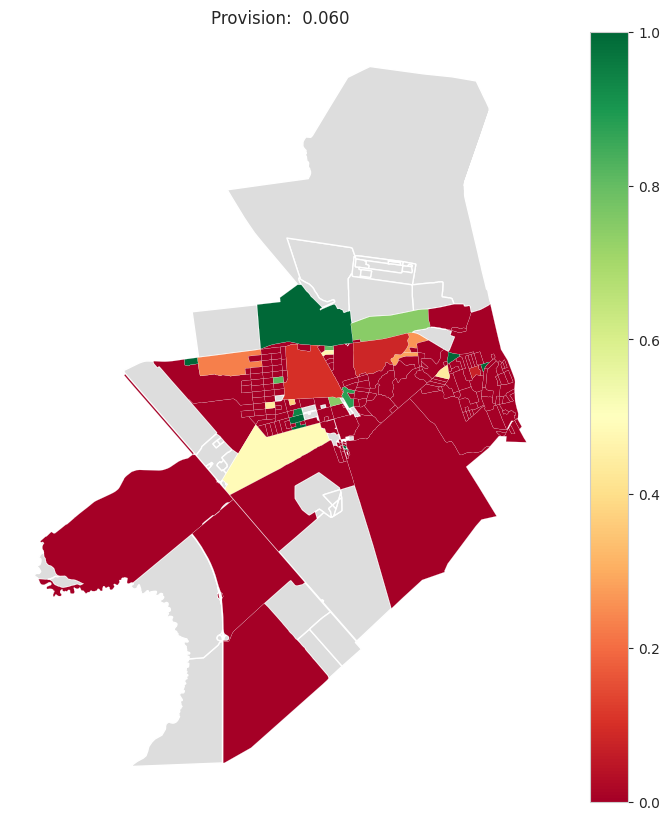

In [501]:
from blocksnet import Provision, ProvisionMethod
service_type = 'bus_station'
prov = Provision(city_model=city)
prov_res = prov.calculate(service_type)
prov.plot(prov_res)

2024-12-24 19:06:56.505 | INFO     | blocksnet.method.provision:_lp_provision:320 - Setting an LP problem for accessibility = 7 : 193x1
2024-12-24 19:06:56.574 | INFO     | blocksnet.method.provision:_lp_provision:354 - Solving the problem
2024-12-24 19:06:56.637 | INFO     | blocksnet.method.provision:_lp_provision:358 - Restoring values from variables
2024-12-24 19:06:56.671 | SUCCESS  | blocksnet.method.provision:calculate:269 - Provision assessment finished


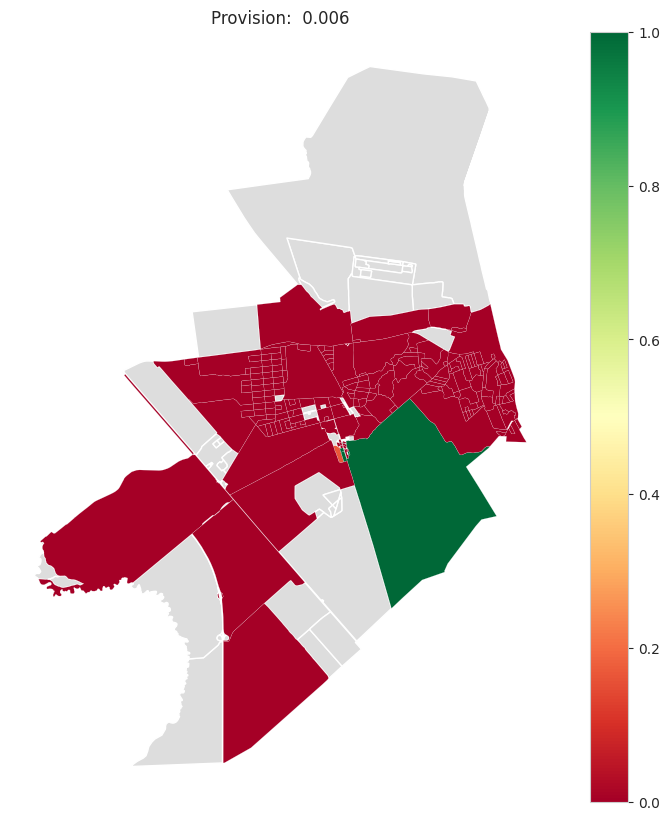

In [502]:
from blocksnet import Provision, ProvisionMethod
service_type = 'kindergarten'
prov = Provision(city_model=city)
prov_res = prov.calculate(service_type)
prov.plot(prov_res)

2024-12-24 19:06:58.189 | INFO     | blocksnet.method.provision:_lp_provision:320 - Setting an LP problem for accessibility = 15 : 193x1
2024-12-24 19:06:58.209 | INFO     | blocksnet.method.provision:_lp_provision:354 - Solving the problem
2024-12-24 19:06:58.227 | INFO     | blocksnet.method.provision:_lp_provision:358 - Restoring values from variables
2024-12-24 19:06:58.237 | SUCCESS  | blocksnet.method.provision:calculate:269 - Provision assessment finished


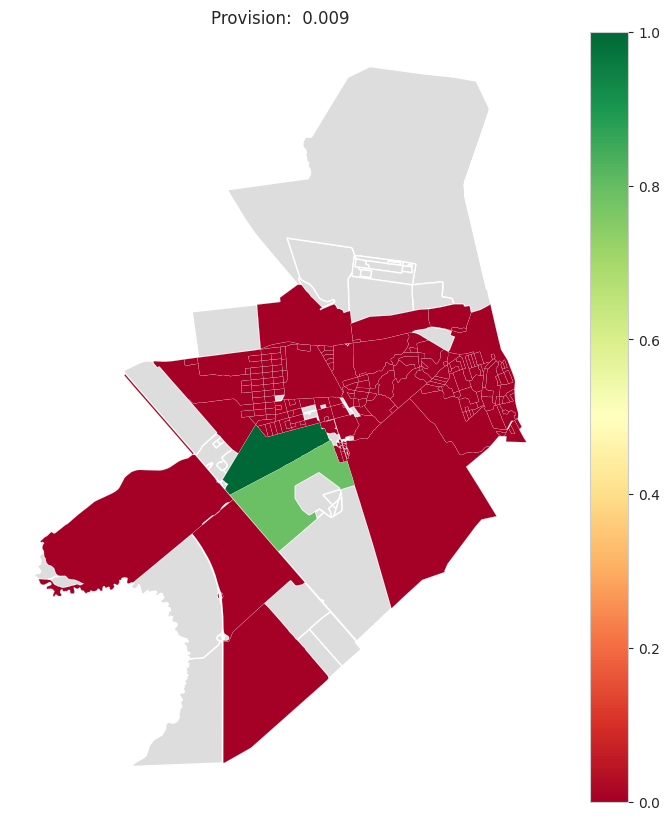

In [503]:
from blocksnet import Provision, ProvisionMethod
service_type = 'school'
prov = Provision(city_model=city)
prov_res = prov.calculate(service_type)
prov.plot(prov_res)

2024-12-24 19:06:58.957 | INFO     | blocksnet.method.provision:_lp_provision:320 - Setting an LP problem for accessibility = 15 : 193x2
2024-12-24 19:06:58.990 | INFO     | blocksnet.method.provision:_lp_provision:354 - Solving the problem
2024-12-24 19:06:59.022 | INFO     | blocksnet.method.provision:_lp_provision:358 - Restoring values from variables
2024-12-24 19:06:59.036 | SUCCESS  | blocksnet.method.provision:calculate:269 - Provision assessment finished


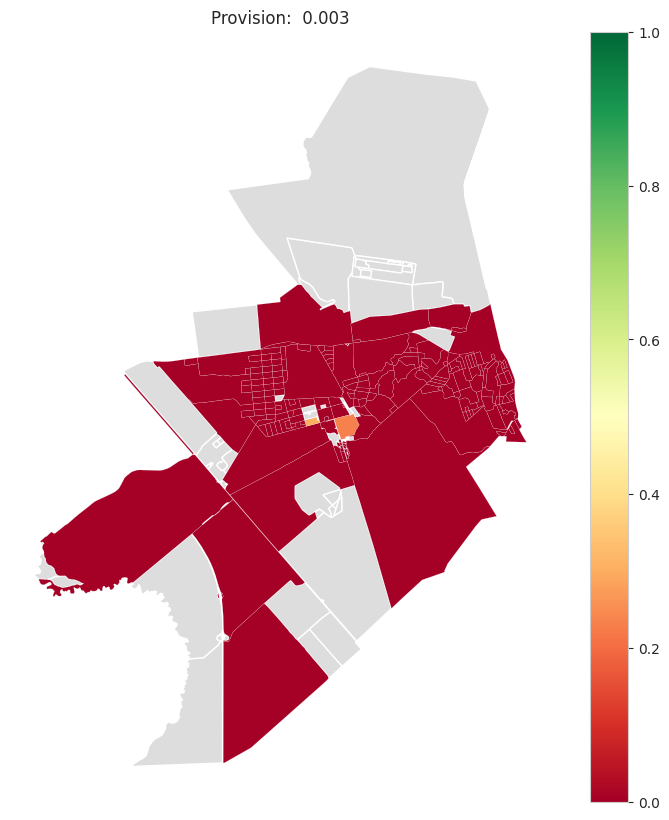

In [504]:
from blocksnet import Provision, ProvisionMethod
service_type = 'supermarket'
prov = Provision(city_model=city)
prov_res = prov.calculate(service_type)
prov.plot(prov_res)

-------

###Оценка центральности по транспортной связности и разнообразию сервисов в кварталах

In [505]:
from blocksnet import Centrality, PopulationCentrality

In [506]:
centrality = Centrality(city_model=city)
result_centrality = centrality.calculate()
result_centrality

,geometry,connectivity,density,diversity,centrality
id,,,,,
0,"POLYGON ((365578.066 6618818.811, 365585.179 6...",6.222656,NaN,NaN,NaN
1,"POLYGON ((365585.179 6618823.682, 365578.066 6...",4.917969,0.00003,-0.0,0.148299
2,"POLYGON ((367700.433 6616376.542, 367698.837 6...",3.593750,NaN,NaN,NaN
3,"POLYGON ((367699.528 6616357.359, 367698.808 6...",5.835938,NaN,NaN,NaN
4,"POLYGON ((368477.180 6617657.195, 368413.340 6...",2.785156,NaN,NaN,NaN
...,...,...,...,...,...
327,"POLYGON ((370449.324 6618051.325, 370432.307 6...",2.667969,NaN,NaN,NaN
328,"POLYGON ((370460.756 6618032.684, 370449.324 6...",2.660156,NaN,NaN,NaN
329,"POLYGON ((370467.724 6618030.470, 370467.981 6...",2.667969,NaN,NaN,NaN


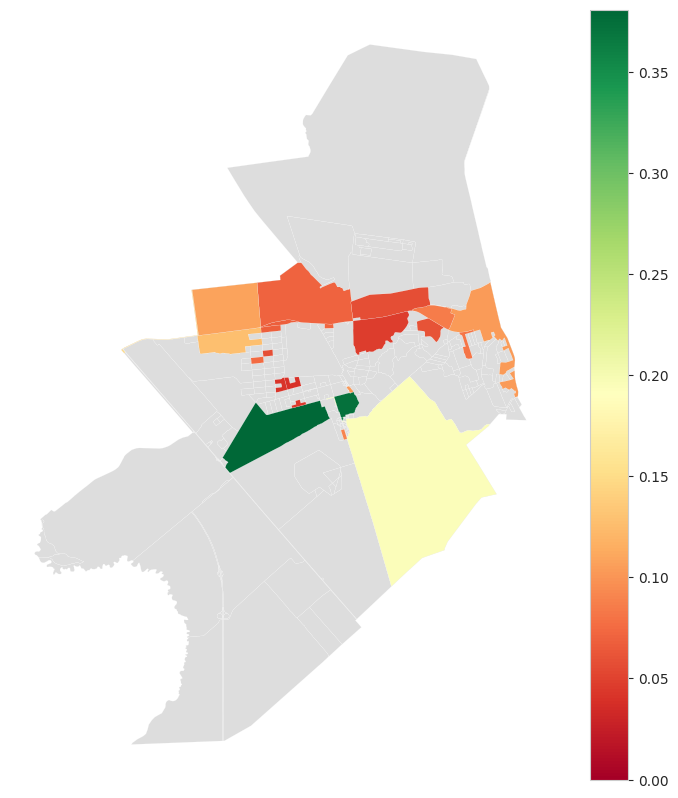

In [507]:
Centrality.plot(result_centrality, figsize =(10,10))

###Оценка центральности по транспортной связности и населению в квартала

In [508]:
centrality_population = PopulationCentrality(city_model=city)
result_centrlity_population = centrality_population.calculate()
result_centrlity_population

,geometry,population_centrality
id,,
0,"POLYGON ((365578.066 6618818.811, 365585.179 6...",0.06
1,"POLYGON ((365585.179 6618823.682, 365578.066 6...",NaN
2,"POLYGON ((367700.433 6616376.542, 367698.837 6...",1.57
3,"POLYGON ((367699.528 6616357.359, 367698.808 6...",0.06
4,"POLYGON ((368477.180 6617657.195, 368413.340 6...",3.45
...,...,...
328,"POLYGON ((370460.756 6618032.684, 370449.324 6...",5.24
329,"POLYGON ((370467.724 6618030.470, 370467.981 6...",5.24
330,"POLYGON ((370455.659 6618057.013, 370439.946 6...",5.24


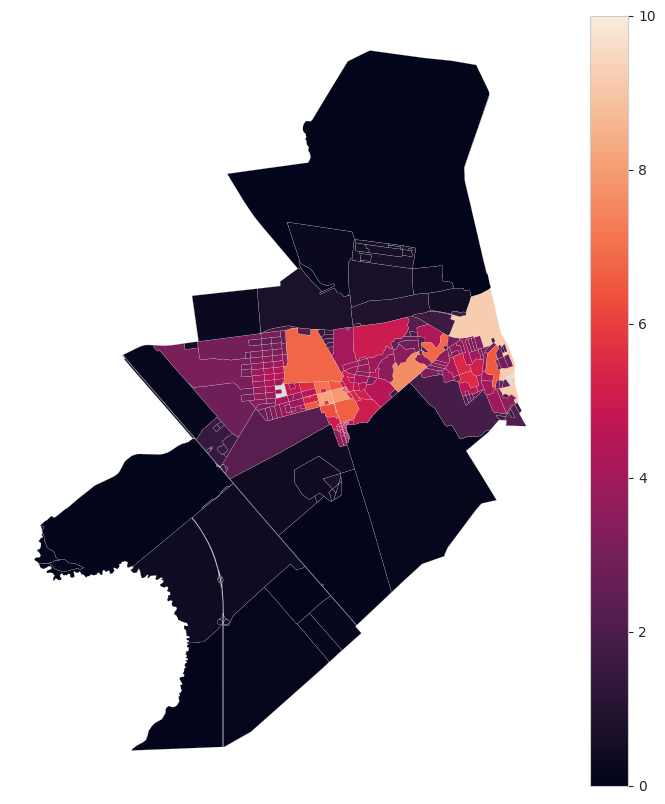

In [509]:
PopulationCentrality.plot(result_centrlity_population, figsize =(10,10))

-----------------------

### Доступность

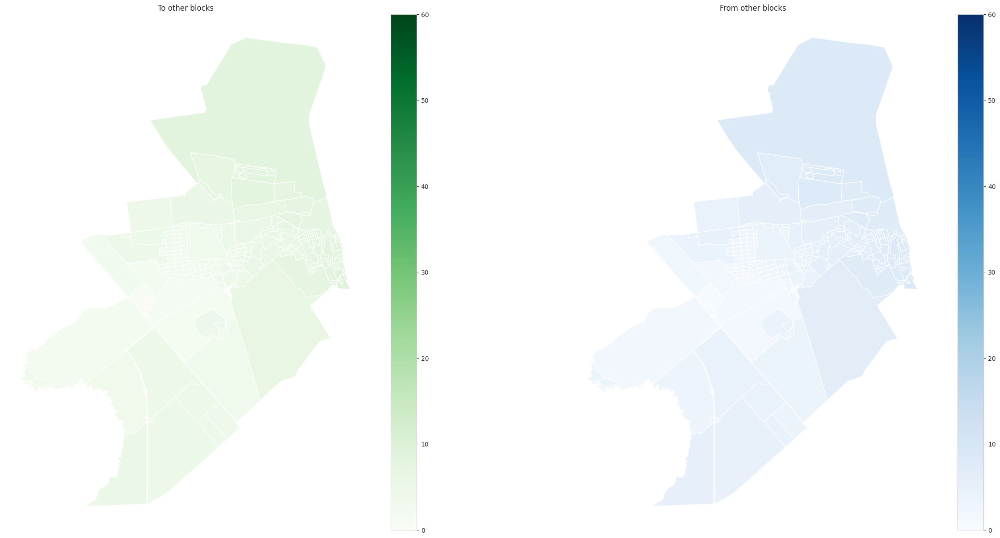

In [510]:
from blocksnet import Accessibility, Connectivity
accessibility = Accessibility(city_model=city)
block = city[2] # квартал от которого будем считать доступность
result = accessibility.calculate(block)

Accessibility.plot(result, linewidth=0.9, figsize=(30,15))

In [511]:
city.to_pickle(os.path.join(results_path,'city_model_scenario 1.pickle'))